In [1]:
!nvidia-smi

Thu Jan  9 07:16:06 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 905.3/905.3 kB 23.1 MB/s eta 0:00:00


In [3]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo checks


Ultralytics 8.3.58 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.5/112.6 GB disk)

OS                  Linux-6.1.85+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
Disk                32.5/112.6 GB
CPU                 Intel Xeon 2.00GHz
CPU count           2
GPU                 Tesla T4, 15102MiB
GPU count           1
CUDA                12.1

numpy               ✅ 1.26.4>=1.23.0
numpy               ✅ 1.26.4<2.0.0; sys_platform == "darwin"
matplotlib          ✅ 3.10.0>=3.3.0
opencv-python       ✅ 4.10.0.84>=4.6.0
pillow              ✅ 11.1.0>=7.1.2
pyyaml              ✅ 6.0.2>=5.3.1
requests            ✅ 2.32.3>=2.23.0
scipy               ✅ 1.13.1>=1.4.1
torch               ✅ 2.5.1+cu121>=1.8.0
torch               ✅ 2.5.1+cu121!=2.4.0,>=1.8.0; sys_platform == "win32"
torchvision         ✅ 0.20.1+cu121>=0.9.0
tqdm                ✅ 4.67.1>=4.64.0
ps

In [ ]:
#!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=20 imgsz=640

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. Rerun Training with Proper Settings
Use the following command to train again, ensuring weights are saved this time:

python
Copy code
model.train(data='/content/drive/MyDrive/dataset/data.yaml', epochs=20, imgsz=640, save=True)
save=True ensures checkpoints (best.pt and last.pt) are saved automatically.
After training, verify the weights:
bash
Copy code
!ls runs/detect/train/weights
You should see files like best.pt and last.pt.

2. Resume Training for Additional Epochs
If training completes successfully and weights are saved, you can resume training for more epochs later:

python
Copy code
model.train(data='/content/drive/MyDrive/dataset/data.yaml', epochs=40, imgsz=640, resume=True)
This will start from where the last training left off.

3. Save the Checkpoints Safely
After training, copy the weights to a safe location (e.g., Google Drive):

bash
Copy code
!cp runs/detect/train/weights/best.pt /content/drive/MyDrive/yolo_weights/
This ensures you won't lose the trained model if Colab disconnects.

from ultralytics import YOLO

# Load the best model
model = YOLO('/content/runs/train/train/weights/best.pt')  # Update the path

# Resume training
model.train(data='/content/drive/MyDrive/dataset/data.yaml', epochs=10, imgsz=640, name='fine_tune')



In [6]:
import cv2
import os

def convert_to_grayscale(input_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for filename in os.listdir(input_dir):
        img_path = os.path.join(input_dir, filename)
        img = cv2.imread(img_path)
        if img is not None:
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            output_path = os.path.join(output_dir, filename)
            cv2.imwrite(output_path, gray_img)

# Paths to your dataset directories
input_dir_train = '/content/drive/MyDrive/dataset_gray/train/images'
output_dir_train = '/content/drive/MyDrive/dataset_gray/train/images_grayscale'

# Convert all images to grayscale
convert_to_grayscale(input_dir_train, output_dir_train)

# Paths to your dataset directories
input_dir_test = '/content/drive/MyDrive/dataset/test/images'
output_dir_test = '/content/drive/MyDrive/dataset/test/images_grayscale'

# Convert all images to grayscale
convert_to_grayscale(input_dir_test, output_dir_test)

# Paths to your dataset directories
input_dir_val = '/content/drive/MyDrive/dataset/val/images'
output_dir_val = '/content/drive/MyDrive/dataset/val/images_grayscale'

# Convert all images to grayscale
convert_to_grayscale(input_dir_val, output_dir_val)



In [10]:
import os

# Paths
label_dir = '/content/drive/MyDrive/dataset_gray/train/labels'
label_files = os.listdir(label_dir)

# Check for empty or missing labels
empty_labels = []
for file in label_files:
    file_path = os.path.join(label_dir, file)
    if os.path.getsize(file_path) == 0:  # Empty file
        empty_labels.append(file)

if not label_files:
    print("No label files found!")
elif empty_labels:
    print(f"Empty label files: {empty_labels}")
else:
    print("All label files are present and contain data.")


All label files are present and contain data.


In [5]:
import os

def check_labels(image_dir, label_dir):
    images = {os.path.splitext(f)[0] for f in os.listdir(image_dir) if f.endswith('.jpg')}
    labels = {os.path.splitext(f)[0] for f in os.listdir(label_dir) if f.endswith('.txt')}

    missing_labels = images - labels
    if missing_labels:
        print(f"Missing labels for images: {missing_labels}")
    else:
        print("All images have corresponding labels.")

# Paths to your dataset
base_path = '/content/drive/MyDrive/dataset_gray'
check_labels(f'{base_path}/train/images', f'{base_path}/train/labels')
check_labels(f'{base_path}/val/images', f'{base_path}/val/labels')
check_labels(f'{base_path}/test/images', f'{base_path}/test/labels')

All images have corresponding labels.
All images have corresponding labels.
All images have corresponding labels.


In [6]:
# Load the YOLO model
model = YOLO('yolov8m.pt')  # You can use 'yolov8s.pt' or 'yolov8n.pt' for smaller models


# Train the model
model.train(data='/content/drive/MyDrive/dataset_gray/data.yaml', epochs=20, imgsz=640, name='train', save=True)
#model.train(data='/content/drive/MyDrive/dataset/data.yaml', epochs=20, imgsz=640, ####I should add this too )name='train')
# in below way it will save the results
# model.train(data='/content/drive/MyDrive/dataset/data.yaml', epochs=40, imgsz=640, resume=True)

100%|██████████| 49.7M/49.7M [00:00<00:00, 102MB/s] 


Ultralytics 8.3.58 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/dataset_gray/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_co

100%|██████████| 755k/755k [00:00<00:00, 22.0MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 96.2MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/dataset_gray/train/labels... 1538 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1538/1538 [10:32<00:00,  2.43it/s]


train: New cache created: /content/drive/MyDrive/dataset_gray/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/dataset_gray/val/labels... 317 images, 0 backgrounds, 0 corrupt: 100%|██████████| 317/317 [02:05<00:00,  2.53it/s]

val: New cache created: /content/drive/MyDrive/dataset_gray/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      6.82G     0.7706      2.103      1.338          4        640: 100%|██████████| 97/97 [00:54<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]

                   all        317        323      0.447      0.505      0.389      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      6.75G     0.9371      1.532      1.429          6        640: 100%|██████████| 97/97 [00:54<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.54it/s]

                   all        317        323      0.348      0.598      0.417      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      6.87G     0.9413       1.42      1.434          6        640: 100%|██████████| 97/97 [00:52<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.51it/s]

                   all        317        323      0.692      0.453      0.502      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      6.86G     0.9189      1.342      1.401          6        640: 100%|██████████| 97/97 [00:52<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]

                   all        317        323      0.615      0.577      0.602      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      6.85G     0.8916       1.24      1.392          4        640: 100%|██████████| 97/97 [00:52<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.57it/s]

                   all        317        323      0.795      0.767      0.817      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      6.75G     0.8336      1.116      1.351          3        640: 100%|██████████| 97/97 [00:52<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.67it/s]

                   all        317        323      0.708      0.768      0.817      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      6.87G     0.8097      1.078      1.318          5        640: 100%|██████████| 97/97 [00:52<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]

                   all        317        323       0.82      0.786      0.844      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      6.85G     0.7621      1.004      1.289          6        640: 100%|██████████| 97/97 [00:52<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.57it/s]

                   all        317        323      0.817      0.791      0.852      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      6.85G     0.7494     0.9417      1.273          3        640: 100%|██████████| 97/97 [00:52<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.55it/s]

                   all        317        323      0.843      0.838      0.878      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      6.75G     0.7052     0.8797      1.242          6        640: 100%|██████████| 97/97 [00:51<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.14it/s]

                   all        317        323      0.838       0.82      0.893      0.708


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      6.87G     0.6278     0.6599       1.28          2        640: 100%|██████████| 97/97 [00:54<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.72it/s]

                   all        317        323      0.864      0.841      0.907      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      6.85G     0.6338     0.6723      1.286          2        640: 100%|██████████| 97/97 [00:51<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]

                   all        317        323      0.782      0.844      0.876      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      6.84G      0.587     0.5934      1.232          2        640: 100%|██████████| 97/97 [00:51<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.61it/s]

                   all        317        323      0.861      0.863      0.885      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      6.75G     0.5627     0.5202        1.2          2        640: 100%|██████████| 97/97 [00:51<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.61it/s]

                   all        317        323      0.835      0.858      0.878      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      6.87G     0.5487     0.5271      1.192          2        640: 100%|██████████| 97/97 [00:52<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.58it/s]

                   all        317        323      0.878      0.854      0.894       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      6.85G     0.5322     0.4898      1.168          2        640: 100%|██████████| 97/97 [00:53<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.57it/s]

                   all        317        323      0.846      0.875      0.881      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      6.85G     0.5198     0.4329      1.164          2        640: 100%|██████████| 97/97 [00:52<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.59it/s]

                   all        317        323      0.896      0.866      0.896      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      6.74G     0.5158     0.4115      1.143          2        640: 100%|██████████| 97/97 [00:52<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.59it/s]

                   all        317        323      0.901      0.894      0.912      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      6.86G     0.4806     0.3696      1.122          2        640: 100%|██████████| 97/97 [00:51<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.75it/s]

                   all        317        323      0.885      0.887      0.899      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      6.84G     0.4725     0.3473      1.127          2        640: 100%|██████████| 97/97 [00:51<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        317        323      0.879      0.879      0.888      0.715



20 epochs completed in 0.331 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.58 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,842,655 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


                   all        317        323      0.885      0.887      0.898      0.742
                  dena         65         65       0.85        0.8      0.891      0.598
            kia_cerato         63         63      0.887      0.968       0.97      0.948
               mazda_3         65         65      0.984       0.93      0.989      0.981
           peogeut_206         69         69      0.747      0.768      0.659      0.216
                 saina         61         61      0.958      0.967      0.984      0.966
Speed: 0.2ms preprocess, 7.5ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cfa55500e50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [ ]:
#If we want to continue plus previous epochs, then we should use below:
# model.train(data='/content/drive/MyDrive/dataset/data.yaml', epochs=40, imgsz=640, name = 'train', resume=True, save=True)

In [ ]:
"""
GPU_mem: The amount of GPU memory being used during training (e.g., 6.82G means 6.82 GB is used).
box_loss: The loss related to bounding box regression (i.e., how accurately the model is predicting object locations).
cls_loss: The classification loss (i.e., how accurately the model is predicting object classes).
dfl_loss: The distributional focal loss, which improves the accuracy of bounding box regression.
Instances: The number of object instances in the batch being processed.
Box(P): Precision of the predicted bounding boxes.
Box(R): Recall of the predicted bounding boxes.
mAP50: Mean Average Precision at IoU=0.50 (the average accuracy for the detection task).
mAP50-95: Mean Average Precision averaged over multiple IoU thresholds (from 0.50 to 0.95).
Precision (P): The proportion of correctly predicted positive detections out of all predicted positives. High precision means fewer false positives (incorrect detections).
Recall (R): The proportion of correctly predicted positive detections out of all actual positives. High recall means fewer false negatives (missed detections).
"""

'\nEpoch: The current training epoch (e.g., 1/20 means you’re on the 1st epoch out of 20 total epochs).\nGPU_mem: The amount of GPU memory being used during training (e.g., 6.82G means 6.82 GB is used).\nbox_loss: The loss related to bounding box regression (i.e., how accurately the model is predicting object locations).\ncls_loss: The classification loss (i.e., how accurately the model is predicting object classes).\ndfl_loss: The distributional focal loss, which improves the accuracy of bounding box regression.\nInstances: The number of object instances in the batch being processed.\nSize: The input image size used for training (e.g., 640 pixels).\n'

In [ ]:
# ~ about 15 min it take FOR INITIALS and about 1 minute for each epoch

In [8]:
# Validate the model
results = model.val(data='/content/drive/MyDrive/dataset_gray/data.yaml', split='val')  # 'split' specifies the validation set

Ultralytics 8.3.58 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/drive/MyDrive/dataset_gray/val/labels.cache... 317 images, 0 backgrounds, 0 corrupt: 100%|██████████| 317/317 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.58it/s]


                   all        317        323      0.892      0.885      0.899      0.741
                  dena         65         65      0.881      0.795       0.89      0.599
            kia_cerato         63         63      0.889      0.968      0.969      0.945
               mazda_3         65         65      0.984      0.928      0.989      0.981
           peogeut_206         69         69      0.748      0.768      0.662      0.216
                 saina         61         61      0.959      0.967      0.984      0.966
Speed: 0.2ms preprocess, 15.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train3


In [9]:
# Test the model
results = model.val(data='/content/drive/MyDrive/dataset_gray/data.yaml', split='test')


Ultralytics 8.3.58 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/drive/MyDrive/dataset_gray/test/labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [01:41<00:00,  2.45it/s]

val: New cache created: /content/drive/MyDrive/dataset_gray/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.60it/s]


                   all        250        259      0.931      0.908      0.912      0.702
                  dena         47         48      0.792      0.688      0.696      0.288
            kia_cerato         46         46      0.922          1      0.995       0.45
               mazda_3         48         48      0.979      0.994      0.994      0.978
           peogeut_206         48         49      0.984      0.918      0.919      0.868
                 saina         64         68      0.976      0.941      0.954      0.926
Speed: 0.2ms preprocess, 15.2ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train4


In [11]:
# Run predictions on test images
predictions = model.predict(source='/content/drive/MyDrive/dataset_gray/test/images', imgsz=640)

# Display the results
from IPython.display import Image, display
import glob

#result_images = glob.glob('runs/predict/*/*.jpg')  # Update if the directory changes
#for img_path in result_images[:5]:  # Show the first 5 predictions
#    display(Image(filename=img_path))



image 1/250 /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (1).jpg: 512x640 2 denas, 28.3ms
image 2/250 /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (10).jpg: 448x640 2 denas, 39.8ms
image 3/250 /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (11).jpg: 384x640 1 dena, 43.9ms
image 4/250 /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (12).jpg: 448x640 1 dena, 28.0ms
image 5/250 /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (13).jpg: 640x480 1 dena, 39.7ms
image 6/250 /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (14).jpg: 512x640 1 mazda_3, 28.9ms
image 7/250 /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (15).jpg: 544x640 2 denas, 40.5ms
image 8/250 /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (16).jpg: 640x384 1 dena, 39.1ms
image 9/250 /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (

In [12]:
# Assuming `results` is an instance of `DetMetrics`
# Access the results directly (no parentheses)
precision = results.mean_results()[1]  # Calling the method to get precision
recall = results.mean_results()[2]     # Calling the method to get recall
map_05 = results.maps[0]               # Accessing the attribute for mAP@0.5
map_05_095 = results.maps[1]           # Accessing the attribute for mAP@0.5:0.95

# Print the results
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"mAP@0.5: {map_05:.2f}")
print(f"mAP@0.5:0.95: {map_05_095:.2f}")

Precision: 0.91
Recall: 0.91
mAP@0.5: 0.29
mAP@0.5:0.95: 0.45



0: 512x640 1 kia_cerato, 29.2ms
Speed: 4.1ms preprocess, 29.2ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


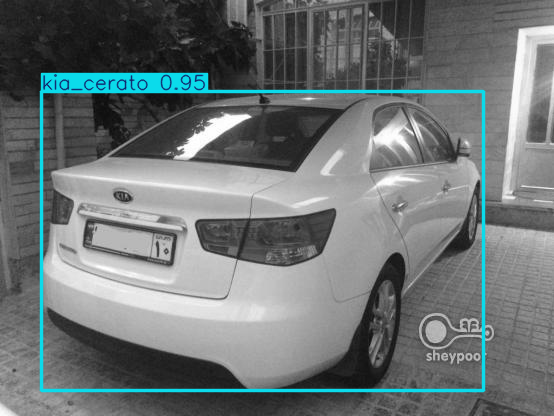

Processed image: /content/drive/MyDrive/dataset_gray/test/images/test-kia_cerato (12).jpg

0: 640x320 1 peogeut_206, 26.4ms
Speed: 2.0ms preprocess, 26.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 320)


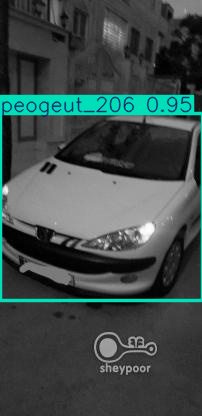

Processed image: /content/drive/MyDrive/dataset_gray/test/images/test_pegeot_206 (40).jpg

0: 512x640 1 kia_cerato, 30.3ms
Speed: 3.8ms preprocess, 30.3ms inference, 2.5ms postprocess per image at shape (1, 3, 512, 640)


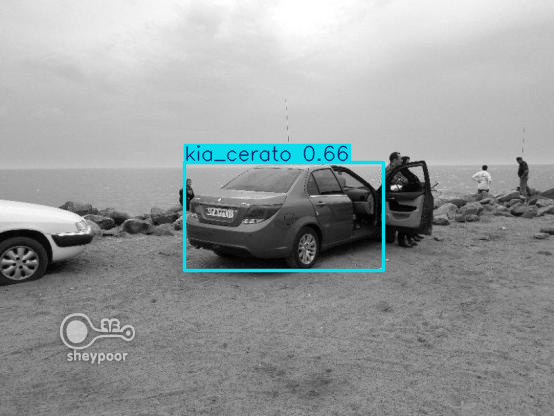

Processed image: /content/drive/MyDrive/dataset_gray/test/images/test-iranKhodro_dena (29).jpg

0: 480x640 1 kia_cerato, 28.9ms
Speed: 3.3ms preprocess, 28.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


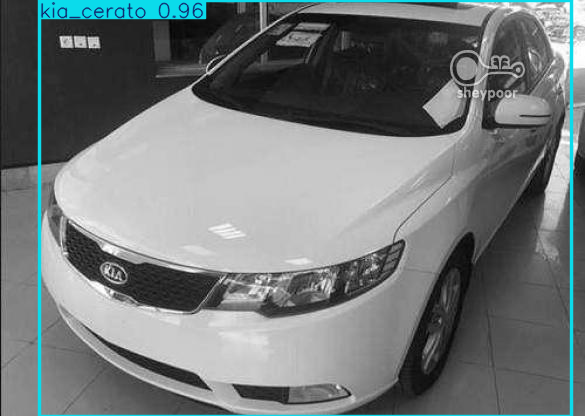

Processed image: /content/drive/MyDrive/dataset_gray/test/images/test-kia_cerato (26).jpg

0: 448x640 1 saina, 28.7ms
Speed: 2.9ms preprocess, 28.7ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


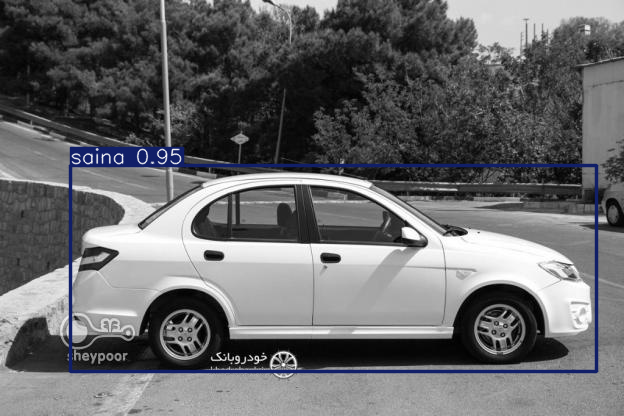

Processed image: /content/drive/MyDrive/dataset_gray/test/images/test_saipa_saina (3).jpg


In [13]:
import random
from google.colab.patches import cv2_imshow
import cv2
import glob

# Get the list of image paths
result_images = glob.glob('/content/drive/MyDrive/dataset_gray/test/images/*.jpg')  # Update path if needed

# Randomly sample 5 images from the list
random_images = random.sample(result_images, 5)

# Loop through the randomly selected images
for img_path in random_images:
    # Load the image
    image = cv2.imread(img_path)

    # Perform object detection
    predictions = model(image)  # Run predictions on the image

    # Display the image with bounding boxes
    for result in predictions:  # Assuming predictions contain multiple results (for each class or detection)
        result.show()  # This will show the image with bounding boxes over detected objects

    # Optionally, you can display the image using cv2_imshow for better visualization in Colab
    # cv2_imshow(image)  # Uncomment to display the image directly

    # Print the image path or other details
    print(f"Processed image: {img_path}")


0: 448x640 1 kia_cerato, 27.5ms
Speed: 3.3ms preprocess, 27.5ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


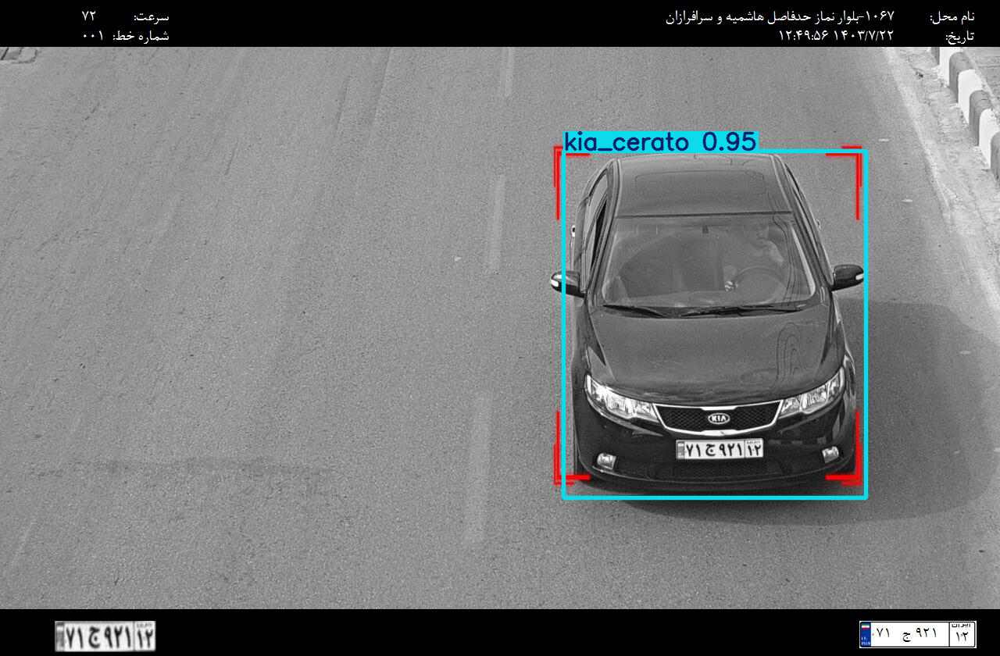


0: 448x640 1 peogeut_206, 27.4ms
Speed: 2.4ms preprocess, 27.4ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)


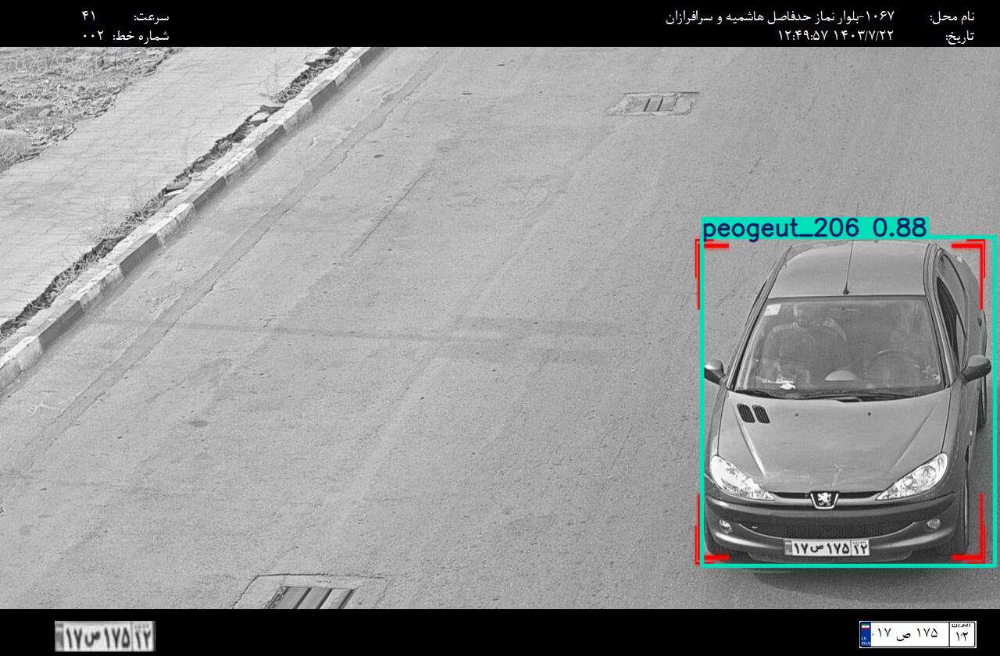


0: 448x640 1 peogeut_206, 27.4ms
Speed: 2.4ms preprocess, 27.4ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


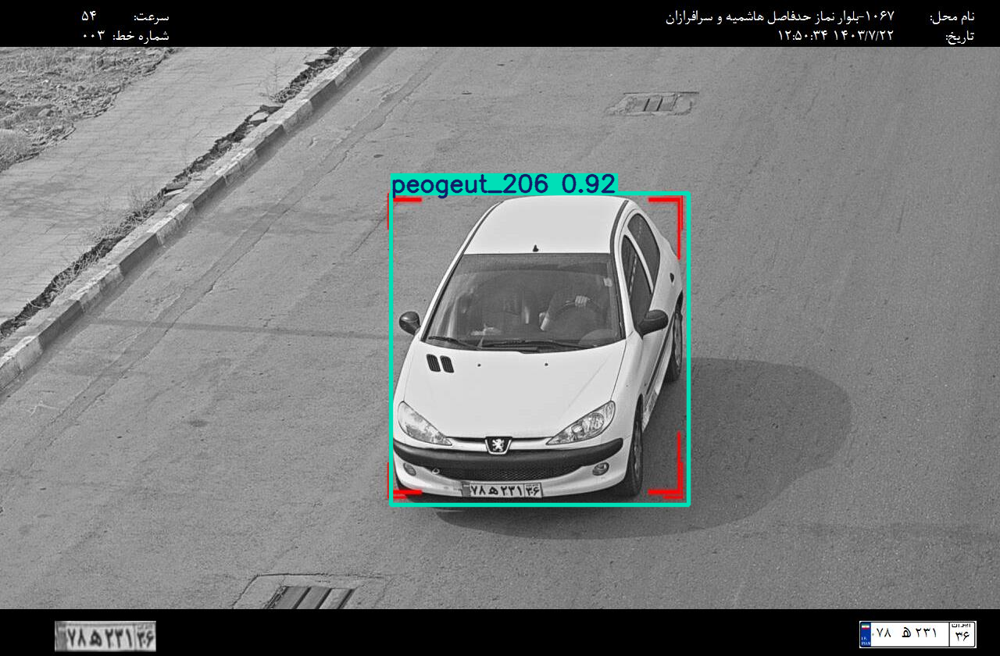


0: 448x640 1 dena, 27.4ms
Speed: 3.2ms preprocess, 27.4ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


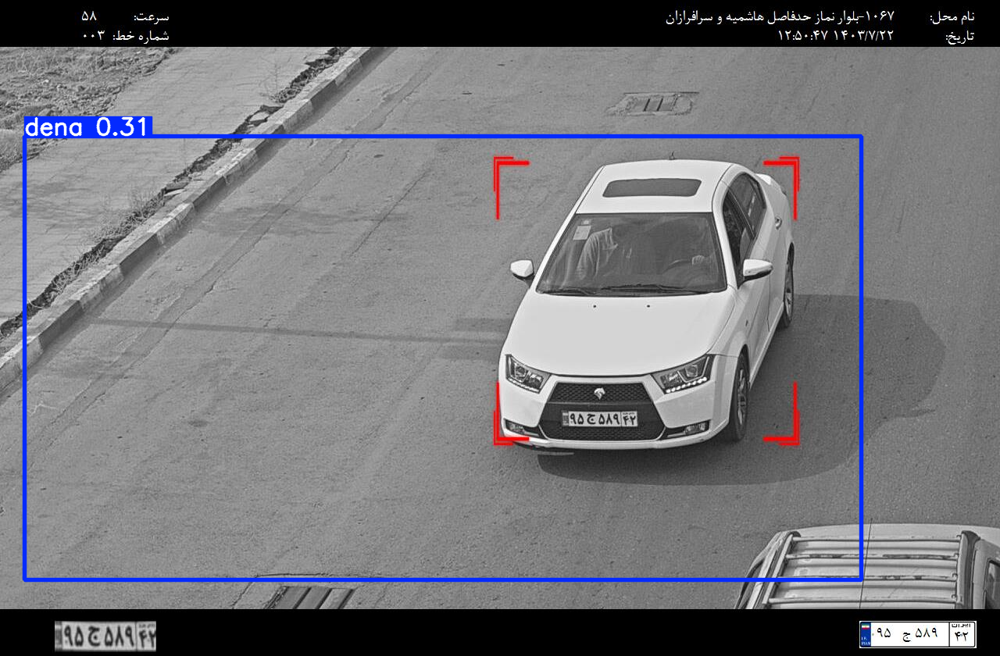


0: 448x640 1 saina, 27.4ms
Speed: 2.4ms preprocess, 27.4ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


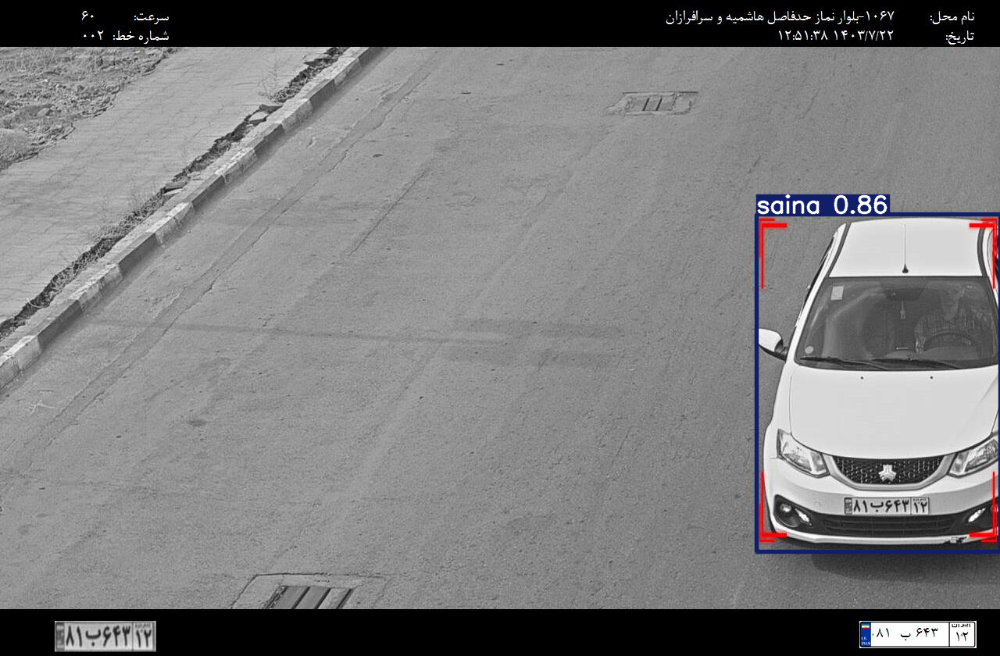


0: 448x640 1 peogeut_206, 29.4ms
Speed: 3.0ms preprocess, 29.4ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


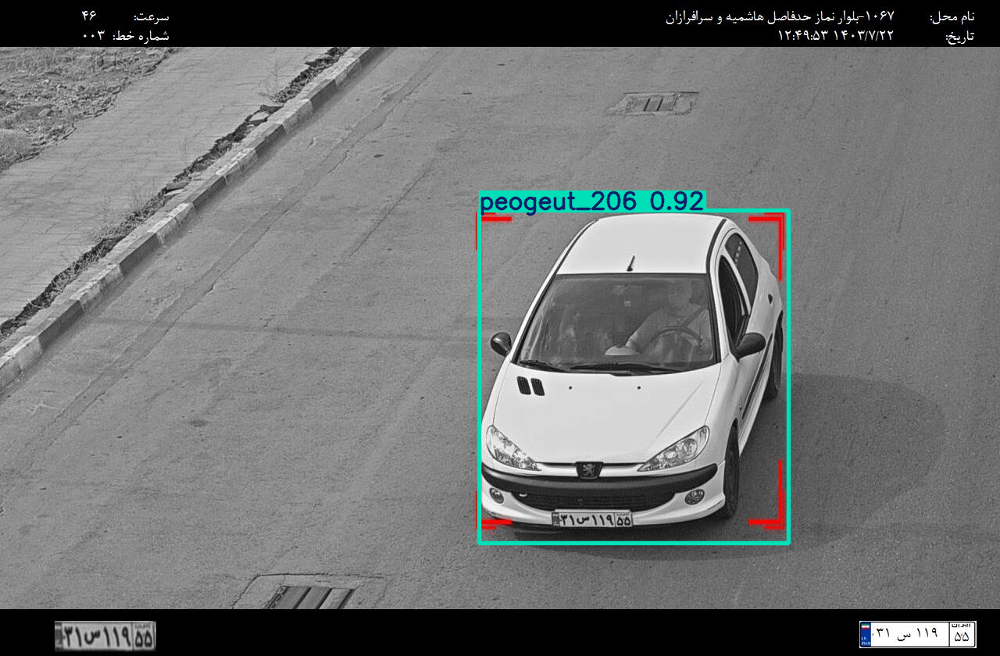

In [18]:
from google.colab.patches import cv2_imshow

# Perform object detection on multiple images
for i in range(1, 7):  # Loop through image numbers 1 to 6
    image_path = f'/content/ ({i}).jpg'  # Construct the image path dynamically with space after /content/
    test_image = cv2.imread(image_path)  # Read the image

    if test_image is None:  # Check if the image exists
        print(f"Image ({i}) not found at {image_path}")
        continue

    # Perform object detection
    predictions = model(test_image)

    # Show the image with bounding boxes
    for result in predictions:
        result.show()


In [ ]:
results = {}

image_dir = './images'
image_files = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])

# Vehicle class IDs (e.g., cars, trucks, buses)
vehicles = [0, 1, 2, 3, 4]

# Initialize frame number
frame_nmr = -1

# Process each image
for image_file in image_files:
    frame_nmr += 1
    frame = cv2.imread(image_file)

    if frame is None:
        continue  # Skip the iteration if the image couldn't be read

    results[frame_nmr] = {}

    # detect vehicles
    detections = coco_model(frame)[0]
    detections_ = []
    for detection in detections.boxes.data.tolist():
        x1, y1, x2, y2, score, class_id = detection
        if int(class_id) in vehicles:  # Filter detections to only include vehicles
            detections_.append([x1, y1, x2, y2, score])
            # Iterate over detections and draw bounding boxes on the frame
    for detection in detections_:
        x1, y1, x2, y2, score = detection
        # Draw bounding box on the frame
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        # Optionally, add a label with the score
        cv2.putText(frame, f"Score: {score:.2f}", (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display the frame with drawn bounding boxes
    cv2.imshow('Detected Vehicles', frame)
    cv2.waitKey(0)  # Adjust or remove this for continuous processing